# Patient Readmission Prediction

## 1. Data Exploration

### 1.1 Exploring dataset columns

In [10]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

**Note:** We prepared the `Actual_Model_Data.csv` using google bigquery

In [2]:
df = pd.read_csv('../../Dataset/Actual_Model_Data.csv')

/var/folders/5m/j6vy15712wdbb9xdp1dmy0jw0000gn/T/ipykernel_5552/3801448537.py:1: DtypeWarning: Columns (16,18) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('../../Dataset/Actual_Model_Data.csv')


In [7]:
df.shape

(534238, 30)

In [8]:
df.head()

,subject_id,hadm_id,race,admittime,dischtime,hospital_expire_flag,readmission_flag,num_procedures,num_unique_procedures,num_unique_icd_codes,num_unique_drugs,num_prescribed_days,num_prescription_records,num_hospital_admissions,proc_icd_codes,diag_icd_codes,drg_concat,top_drg_code,top_drg_type,top_drg_severity,top_drg_mortality,num_emar_medications,num_abnormal_labevents,num_prev_emergency,num_prev_non_emergency,num_prev_general_practice,num_prev_general_surgery,num_prev_internal_medicine,age,charlson_comorbidity_index
0,18671630,29554955,BLACK/AFRICAN AMERICAN,2198-02-24 12:05:00,2198-03-01 14:35:00,0,0,6.0,5.0,18.0,23.0,78.0,29.0,3,10E0XZZ 10907ZC 0UQMXZZ 0WCG0ZZ 0UB70ZZ 0UB70ZZ,O480 Z370 K661 D62 O721 O26833 O9943 Z20822 Z3...,HCFA 768 APR 542,542.0,APR,3.0,2.0,45.0,44.0,0,2,0,0,0,33,0
1,13118941,23589399,WHITE,2148-04-30 17:55:00,2148-05-02 18:20:00,0,0,2.0,2.0,8.0,12.0,24.0,13.0,2,3201 3391,1628 1961 5180 53081 30002 4430 V103 V4571,HCFA 181 APR 136,136.0,APR,2.0,2.0,NaN,14.0,1,0,0,0,4,55,7
2,10556002,24958178,WHITE,2158-02-05 16:29:00,2158-02-07 16:17:00,0,0,1.0,1.0,8.0,11.0,24.0,15.0,2,966,2883 E9361 51889 4928 2722 34590 V441 78079,HCFA 816 APR 663,663.0,APR,2.0,1.0,NaN,15.0,1,0,0,0,1,60,2
3,10730408,27077770,WHITE,2187-05-04 20:49:00,2187-05-06 08:28:00,0,0,1.0,1.0,6.0,13.0,18.0,13.0,3,8611,1737 7824 6959 7823 29590 42731,HCFA 607 APR 385,385.0,APR,2.0,2.0,NaN,21.0,0,2,0,1,4,81,4
4,10892159,29607512,HISPANIC OR LATINO,2129-01-24 15:10:00,2129-01-26 15:06:00,0,0,NaN,NaN,4.0,13.0,24.0,16.0,1,NaN,78900 2809 5589 311,HCFA 392 APR 251,251.0,APR,1.0,1.0,NaN,18.0,0,0,0,0,0,62,2


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 534238 entries, 0 to 534237
Data columns (total 30 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   subject_id                  534238 non-null  int64  
 1   hadm_id                     534238 non-null  int64  
 2   race                        534238 non-null  object 
 3   admittime                   534238 non-null  object 
 4   dischtime                   534238 non-null  object 
 5   hospital_expire_flag        534238 non-null  int64  
 6   readmission_flag            534238 non-null  int64  
 7   num_procedures              277829 non-null  float64
 8   num_unique_procedures       277829 non-null  float64
 9   num_unique_icd_codes        533716 non-null  float64
 10  num_unique_drugs            451607 non-null  float64
 11  num_prescribed_days         451607 non-null  float64
 12  num_prescription_records    451607 non-null  float64
 13  num_hospital_a

In [12]:
df.describe(include='all')

,subject_id,hadm_id,race,admittime,dischtime,hospital_expire_flag,readmission_flag,num_procedures,num_unique_procedures,num_unique_icd_codes,num_unique_drugs,num_prescribed_days,num_prescription_records,num_hospital_admissions,proc_icd_codes,diag_icd_codes,drg_concat,top_drg_code,top_drg_type,top_drg_severity,top_drg_mortality,num_emar_medications,num_abnormal_labevents,num_prev_emergency,num_prev_non_emergency,num_prev_general_practice,num_prev_general_surgery,num_prev_internal_medicine,age,charlson_comorbidity_index
count,5.342380e+05,5.342380e+05,534238,534238,534238,534238.000000,534238.000000,277829.000000,277829.000000,533716.000000,451607.000000,451607.000000,451607.000000,534238.000000,277829,533716,383305,383305.000000,383305,355656.000000,355656.000000,283402.000000,426275.000000,534238.000000,534238.000000,534238.000000,534238.000000,534238.000000,534238.000000,534238.000000
unique,NaN,NaN,33,523339,517458,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,112385,505368,5160,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,WHITE,2136-04-01 07:15:00,2171-02-04 17:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3995,30500,HCFA 775 APR 560,NaN,APR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,329620,6,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2378,2198,7344,NaN,355656,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,1.501089e+07,2.500176e+07,NaN,NaN,NaN,0.000021,0.206329,2.900669,2.761018,11.432861,23.162010,111.983605,40.106542,4.348457,NaN,NaN,NaN,356.822971,NaN,2.389992,2.016997,90.889687,63.183436,2.104581,1.212864,1.891275,0.416781,3.408838,58.886275,3.551217
std,2.877347e+06,2.888967e+06,NaN,NaN,NaN,0.004538,0.404670,2.689387,2.369449,7.419512,13.836681,257.264745,46.730560,8.042622,NaN,NaN,NaN,240.192310,NaN,0.923017,0.994617,180.924809,142.023877,6.753398,2.958574,6.225794,1.277582,7.850794,19.137403,3.023895
min,1.000003e+07,2.000002e+07,NaN,NaN,NaN,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,NaN,NaN,NaN,1.000000,NaN,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000,0.000000
25%,1.252372e+07,2.249684e+07,NaN,NaN,NaN,0.000000,0.000000,1.000000,1.000000,6.000000,14.000000,19.000000,17.000000,1.000000,NaN,NaN,NaN,175.000000,NaN,2.000000,1.000000,14.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,45.000000,1.000000
50%,1.501862e+07,2.500410e+07,NaN,NaN,NaN,0.000000,0.000000,2.000000,2.000000,10.000000,20.000000,47.000000,26.000000,2.000000,NaN,NaN,NaN,282.000000,NaN,2.000000,2.000000,41.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61.000000,3.000000
75%,1.750349e+07,2.750361e+07,NaN,NaN,NaN,0.000000,0.000000,4.000000,4.000000,16.000000,28.000000,113.000000,45.000000,4.000000,NaN,NaN,NaN,540.000000,NaN,3.000000,3.000000,100.000000,64.000000,2.000000,1.000000,2.000000,0.000000,3.000000,74.000000,6.000000


In [13]:
df[df['num_emar_medications'] == 19195]

,subject_id,hadm_id,race,admittime,dischtime,hospital_expire_flag,readmission_flag,num_procedures,num_unique_procedures,num_unique_icd_codes,num_unique_drugs,num_prescribed_days,num_prescription_records,num_hospital_admissions,proc_icd_codes,diag_icd_codes,drg_concat,top_drg_code,top_drg_type,top_drg_severity,top_drg_mortality,num_emar_medications,num_abnormal_labevents,num_prev_emergency,num_prev_non_emergency,num_prev_general_practice,num_prev_general_surgery,num_prev_internal_medicine,age,charlson_comorbidity_index
92703,10253349,26415640,WHITE,2190-05-23 01:00:00,2191-10-20 14:30:00,0,0,20.0,13.0,39.0,144.0,27719.0,2697.0,14,0D2DXUZ 5A1955Z 5A1D70Z 3E0H76Z 0J2TXYZ 04HY32...,F419 Y838 Y92129 Z930 D696 E1069 G40909 X58XXX...,HCFA 622 APR 951,951.0,APR,4.0,4.0,19195.0,5567.0,1,12,7,3,20,43,7


### 1.2 Handling missing values

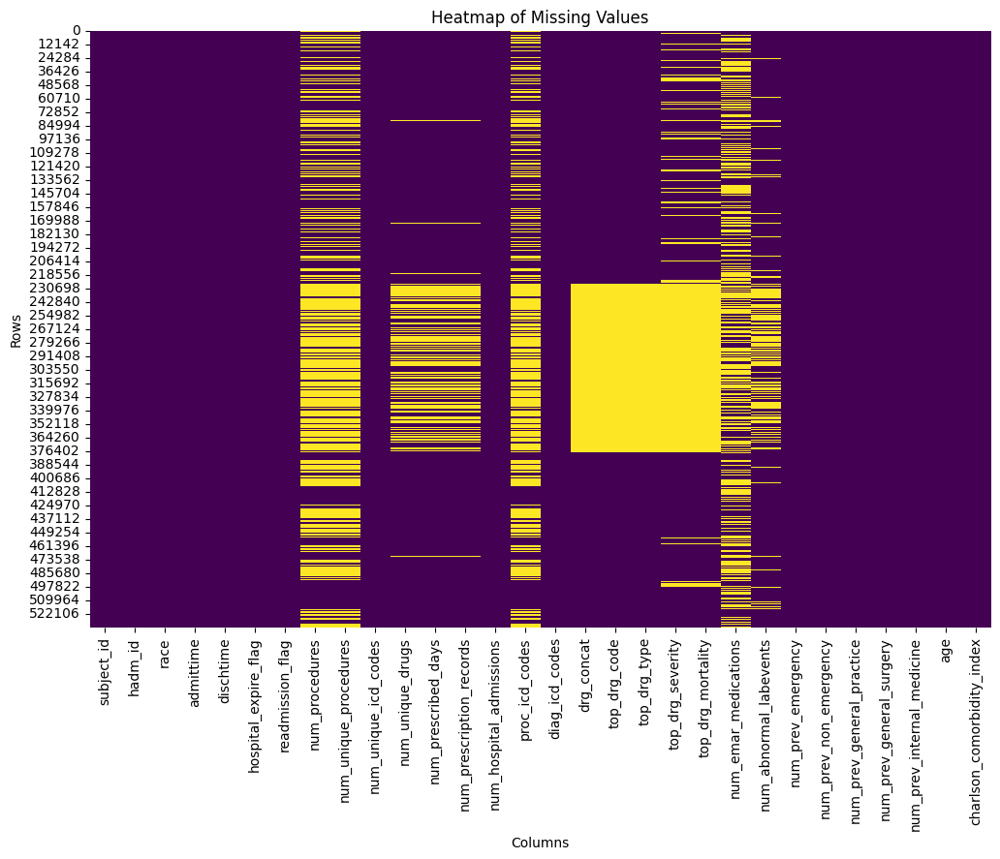

In [15]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Heatmap of Missing Values")
plt.xlabel("Columns")
plt.ylabel("Rows")
plt.show()

In [16]:
for col in df.columns:
    if df[col].dtype == 'object':
        df[col] = df[col].fillna('')
    else:
        df[col] = df[col].fillna(0) 

In [18]:
df.columns

Index(['subject_id', 'hadm_id', 'race', 'admittime', 'dischtime',
       'hospital_expire_flag', 'readmission_flag', 'num_procedures',
       'num_unique_procedures', 'num_unique_icd_codes', 'num_unique_drugs',
       'num_prescribed_days', 'num_prescription_records',
       'num_hospital_admissions', 'proc_icd_codes', 'diag_icd_codes',
       'drg_concat', 'top_drg_code', 'top_drg_type', 'top_drg_severity',
       'top_drg_mortality', 'num_emar_medications', 'num_abnormal_labevents',
       'num_prev_emergency', 'num_prev_non_emergency',
       'num_prev_general_practice', 'num_prev_general_surgery',
       'num_prev_internal_medicine', 'age', 'charlson_comorbidity_index'],
      dtype='object')

In [89]:
df['admittime'] = pd.to_datetime(df['admittime'])
df['dischtime'] = pd.to_datetime(df['dischtime'])

### 1.3 Visualizing Data

#### 1.3.1 Distribution of Readmission

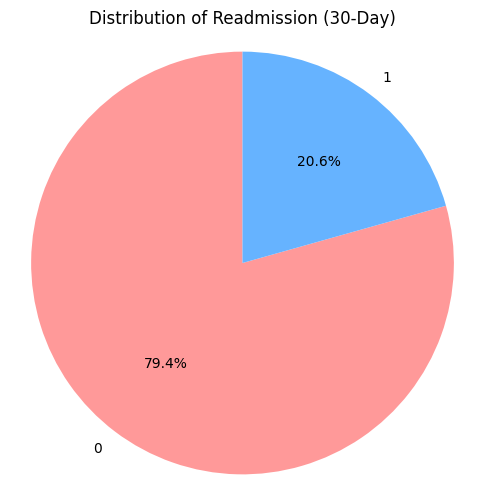

In [91]:
readmission_counts = df['readmission_flag'].value_counts()
plt.figure(figsize=(6, 6))
plt.pie(readmission_counts, labels=readmission_counts.index, autopct='%1.1f%%', startangle=90, colors=['#ff9999','#66b3ff'])
plt.title("Distribution of Readmission (30-Day)")
plt.axis('equal')  
plt.show()

#### 1.3.2 Distribution of Race

/var/folders/5m/j6vy15712wdbb9xdp1dmy0jw0000gn/T/ipykernel_5552/3487236491.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df['race'], order=df['race'].value_counts().index, palette='viridis')


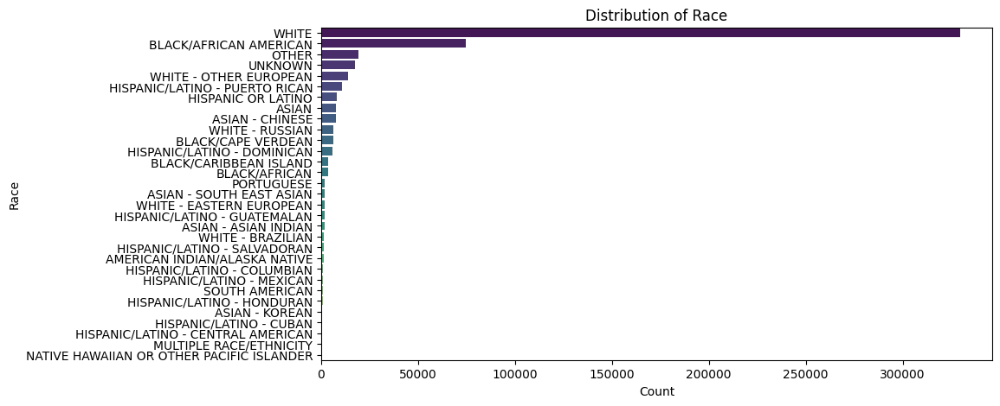

In [92]:

plt.figure(figsize=(10, 5))
sns.countplot(y=df['race'], order=df['race'].value_counts().index, palette='viridis')
plt.title("Distribution of Race")
plt.xlabel("Count")
plt.ylabel("Race")
plt.show()

#### 1.3.3 Distribution of Hospital Length of Stay

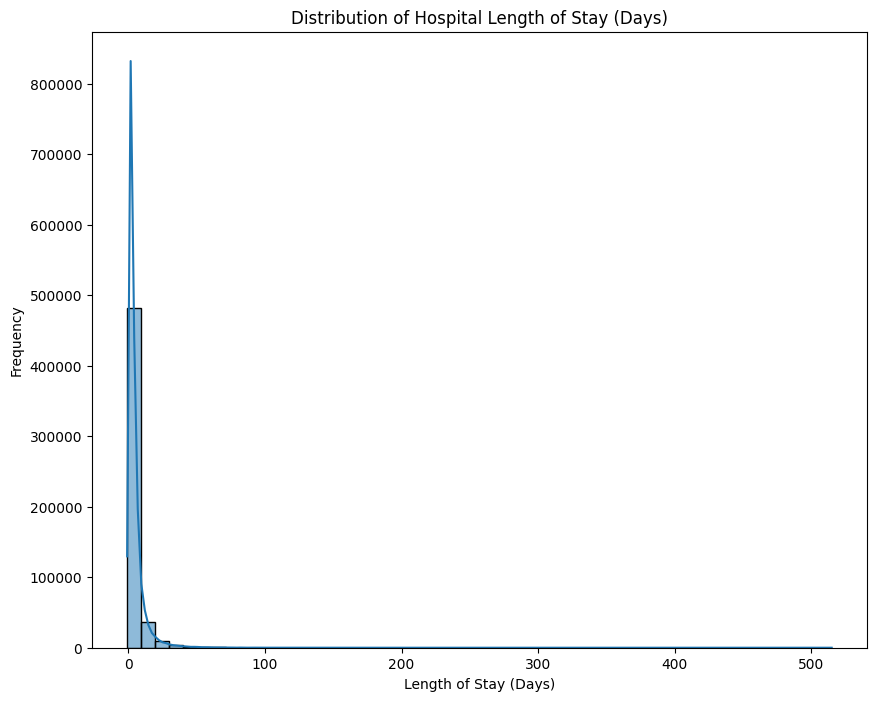

In [94]:

df['length_of_stay'] = (df['dischtime'] - df['admittime']).dt.days
plt.figure(figsize=(10, 8))
sns.histplot(df['length_of_stay'], bins=50, kde=True)
plt.title("Distribution of Hospital Length of Stay (Days)")
plt.xlabel("Length of Stay (Days)")
plt.ylabel("Frequency")
plt.show()

#### 1.3.4 Pairplot of Variables

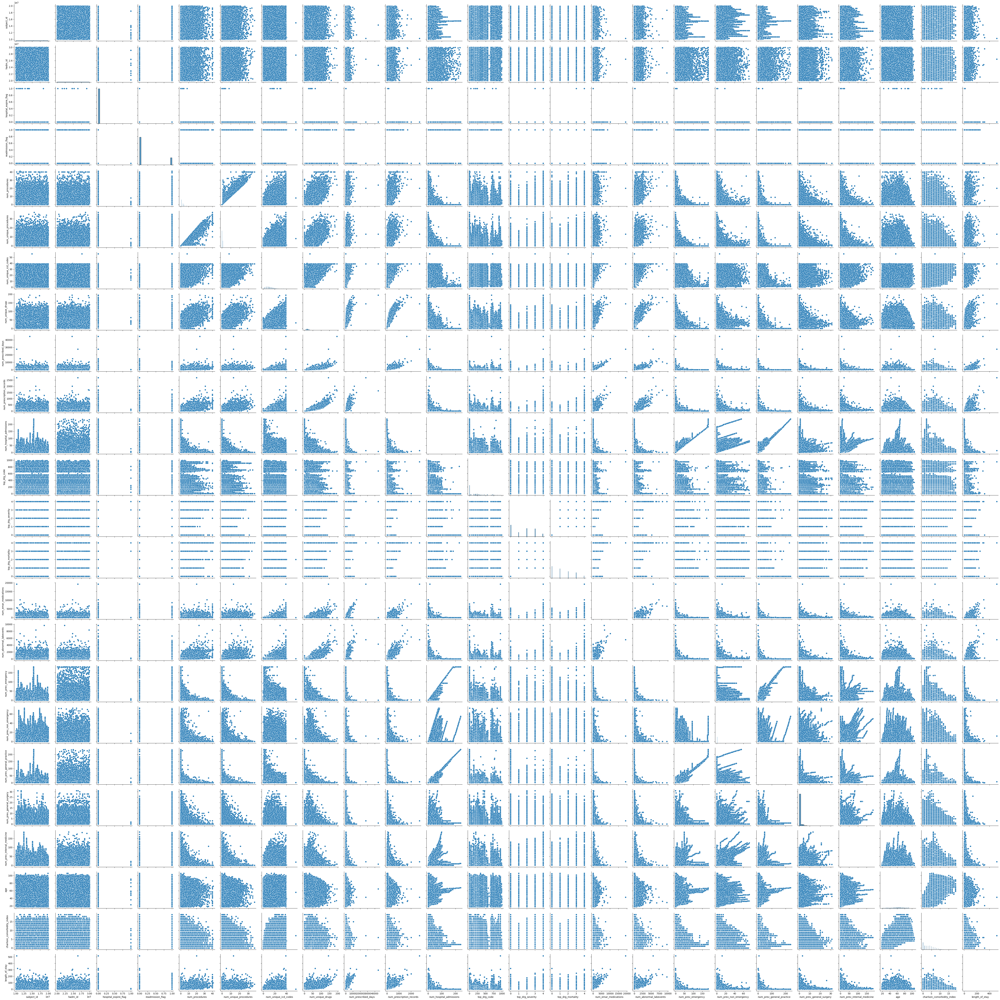

In [95]:
sns.pairplot(df.select_dtypes(include=['float64', 'int64']))
plt.show()

#### 1.3.4 Boxplots of Variables

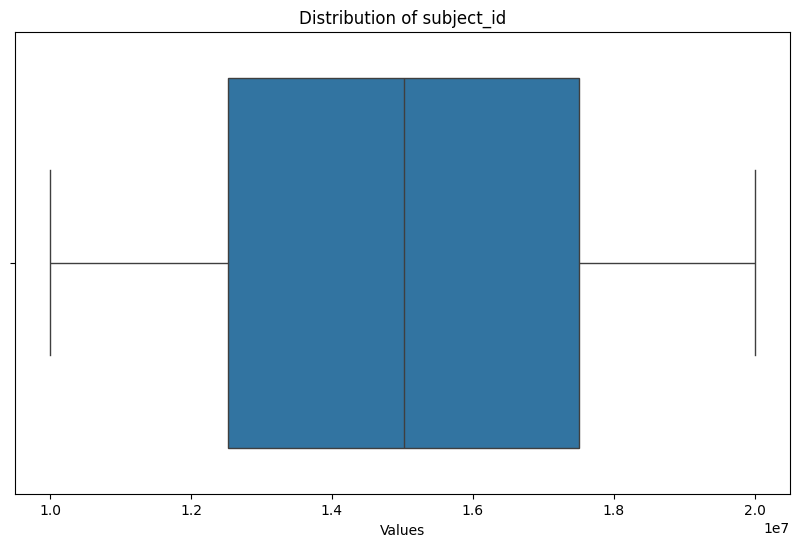

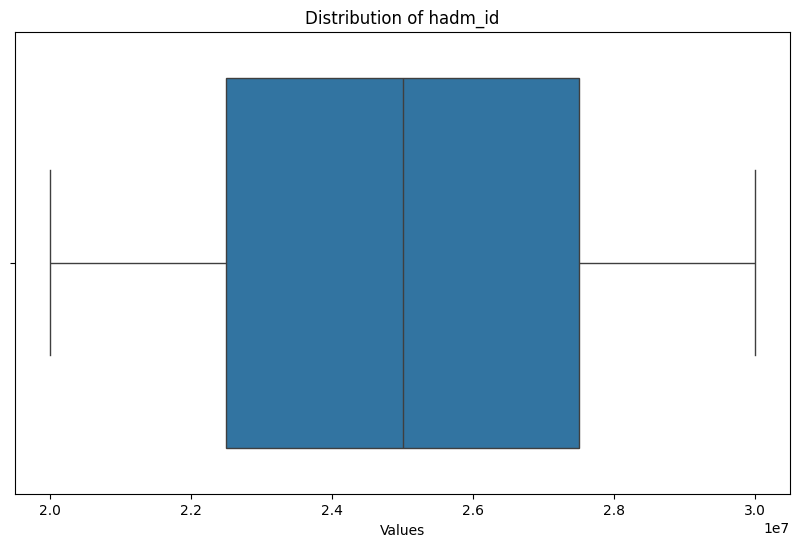

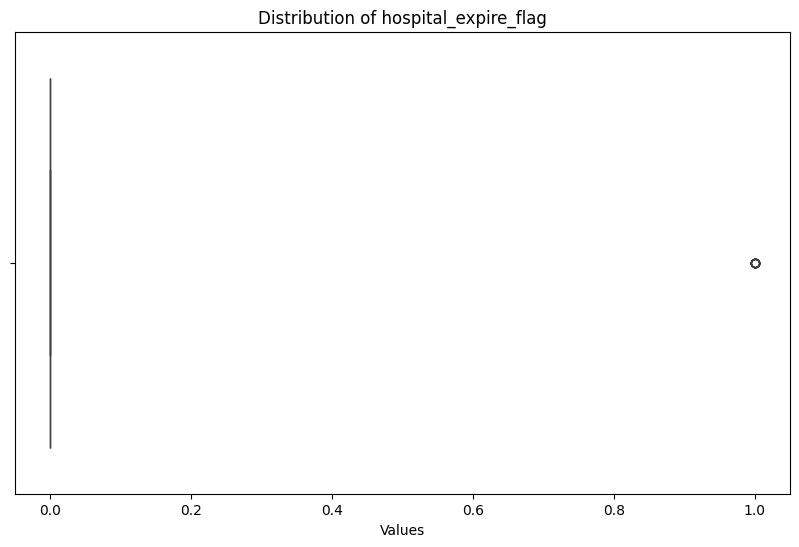

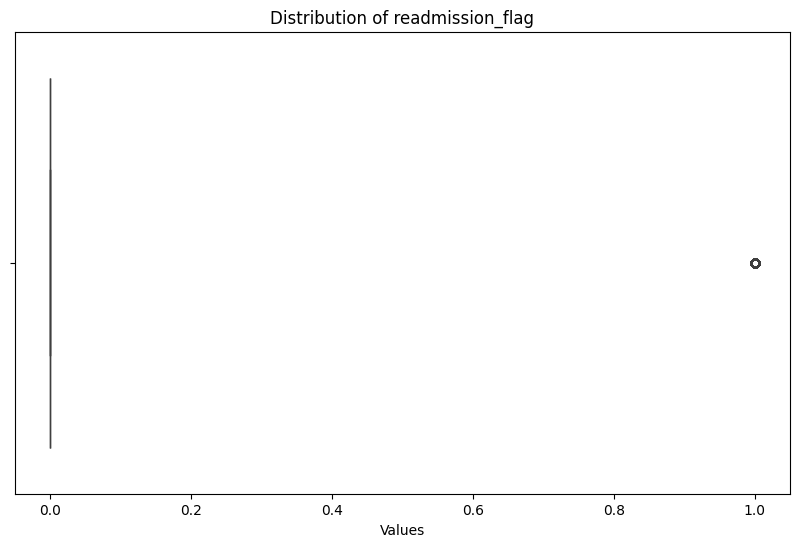

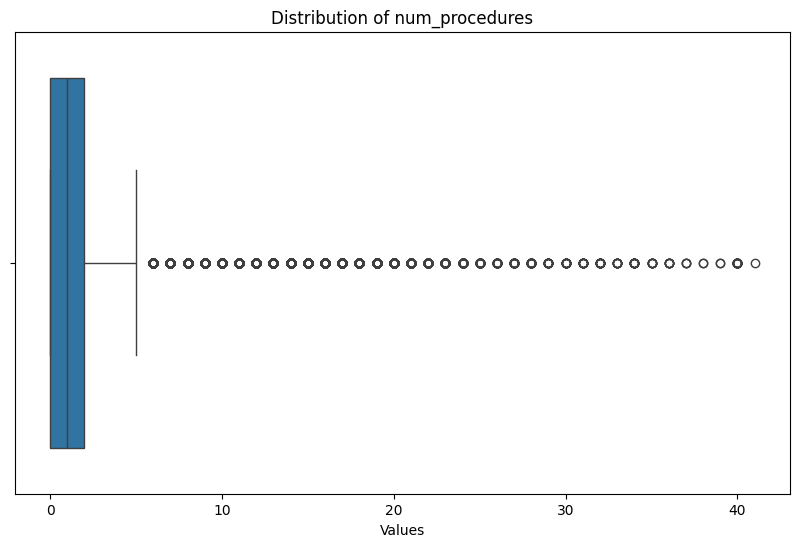

...

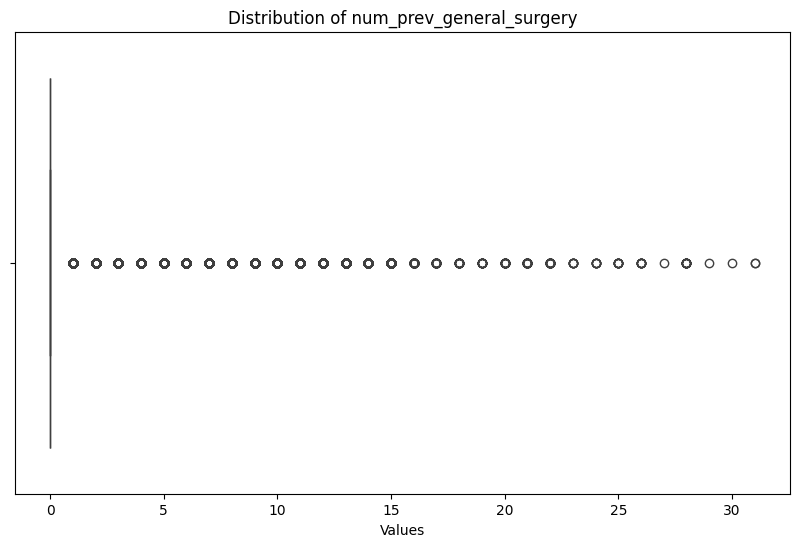

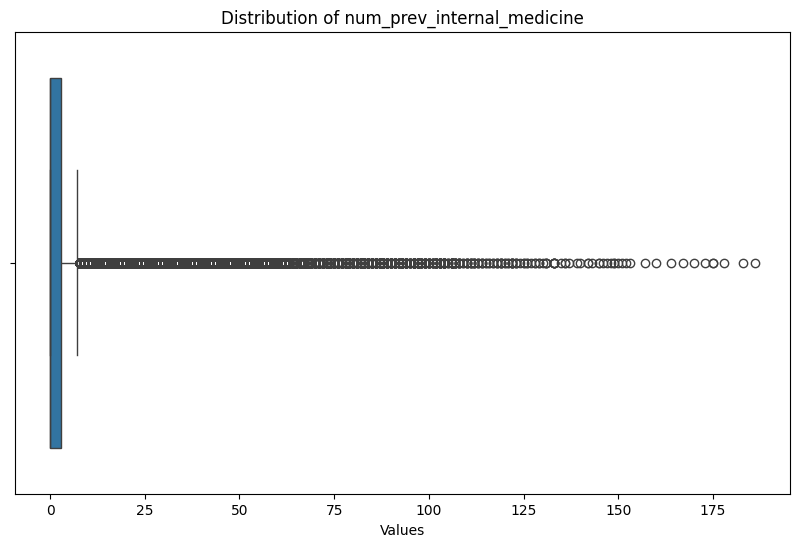

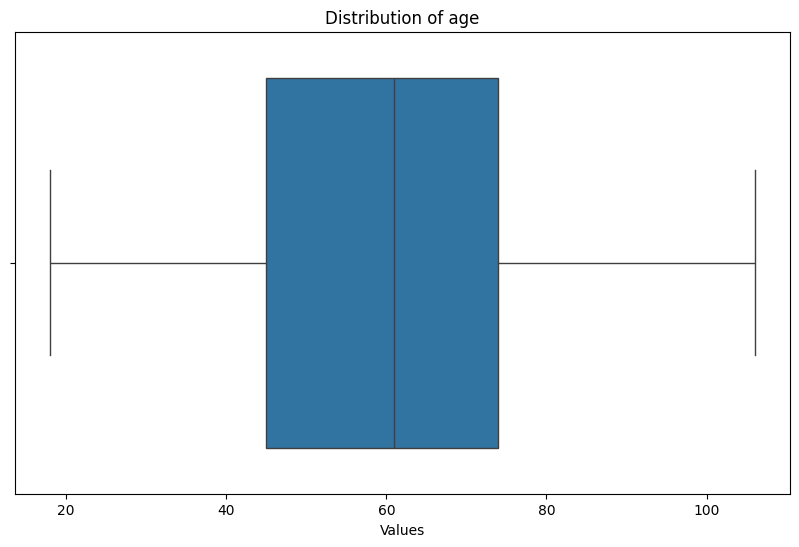

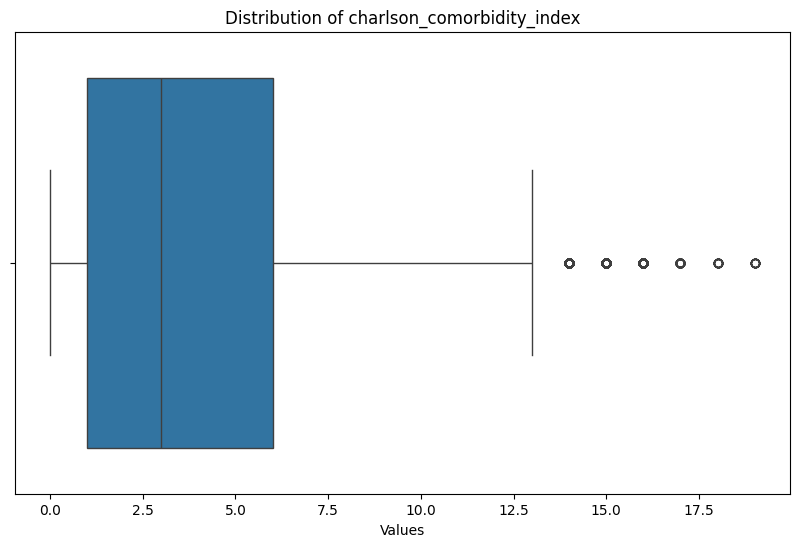

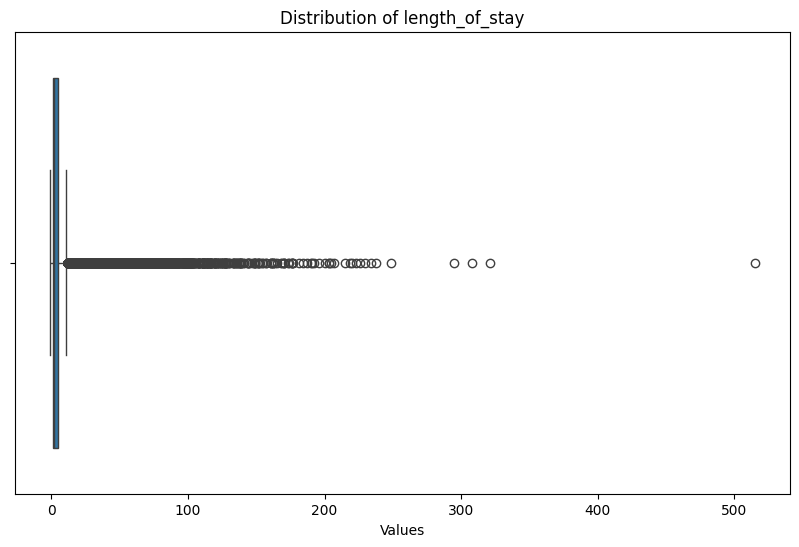

In [96]:

numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

for col in numeric_cols:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df[col])
    plt.title(f'Distribution of {col}')
    plt.xlabel('Values')
    plt.show()
    plt.close()

In [97]:
df.columns

Index(['subject_id', 'hadm_id', 'race', 'admittime', 'dischtime',
       'hospital_expire_flag', 'readmission_flag', 'num_procedures',
       'num_unique_procedures', 'num_unique_icd_codes', 'num_unique_drugs',
       'num_prescribed_days', 'num_prescription_records',
       'num_hospital_admissions', 'proc_icd_codes', 'diag_icd_codes',
       'top_drg_code', 'top_drg_type', 'top_drg_severity', 'top_drg_mortality',
       'num_emar_medications', 'num_abnormal_labevents', 'num_prev_emergency',
       'num_prev_non_emergency', 'num_prev_general_practice',
       'num_prev_general_surgery', 'num_prev_internal_medicine', 'age',
       'charlson_comorbidity_index', 'diag_vector', 'proc_vector',
       'length_of_stay'],
      dtype='object')

## 2. Feature Extraction

In [102]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

features = df.drop(columns=['subject_id', 'hadm_id', 'race', 'readmission_flag', 'admittime', 'dischtime', 'proc_icd_codes', 'diag_icd_codes', 'top_drg_code', 'top_drg_type', 'diag_vector', 'proc_vector'])

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_features)

pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df = pd.concat([pca_df, df[['readmission_flag']].reset_index(drop=True)], axis=1)

print(pca_df.head())

        PC1       PC2  readmission_flag
0  1.146205 -1.031421                 0
1 -0.386218 -0.441821                 0
2 -1.146532 -0.616224                 0
3 -0.629443  0.043144                 0
4 -1.641429 -0.738927                 0


In [103]:
pca.explained_variance_ratio_

array([0.34262453, 0.19232265])

In [104]:
df.columns

Index(['subject_id', 'hadm_id', 'race', 'admittime', 'dischtime',
       'hospital_expire_flag', 'readmission_flag', 'num_procedures',
       'num_unique_procedures', 'num_unique_icd_codes', 'num_unique_drugs',
       'num_prescribed_days', 'num_prescription_records',
       'num_hospital_admissions', 'proc_icd_codes', 'diag_icd_codes',
       'top_drg_code', 'top_drg_type', 'top_drg_severity', 'top_drg_mortality',
       'num_emar_medications', 'num_abnormal_labevents', 'num_prev_emergency',
       'num_prev_non_emergency', 'num_prev_general_practice',
       'num_prev_general_surgery', 'num_prev_internal_medicine', 'age',
       'charlson_comorbidity_index', 'diag_vector', 'proc_vector',
       'length_of_stay'],
      dtype='object')

### 2.1 Feature Correlation

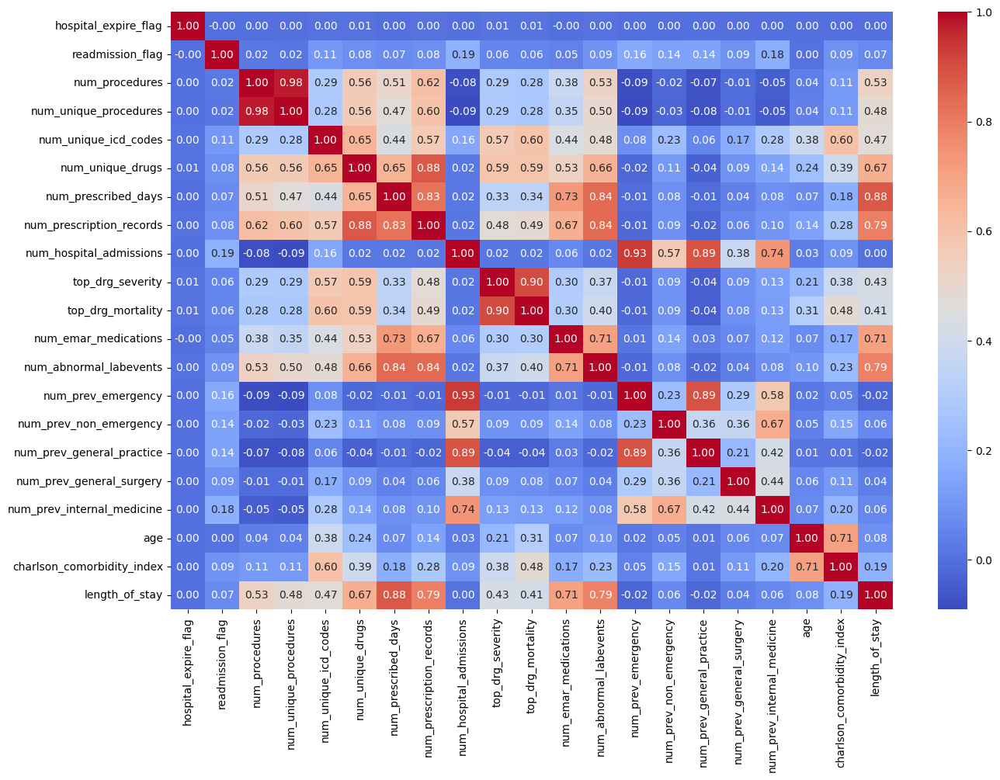

In [106]:
df_num = df[['hospital_expire_flag', 'readmission_flag', 'num_procedures',
       'num_unique_procedures', 'num_unique_icd_codes', 'num_unique_drugs',
       'num_prescribed_days', 'num_prescription_records',
       'num_hospital_admissions','top_drg_severity', 'top_drg_mortality',
       'num_emar_medications', 'num_abnormal_labevents', 'num_prev_emergency',
       'num_prev_non_emergency', 'num_prev_general_practice',
       'num_prev_general_surgery', 'num_prev_internal_medicine', 'age',
       'charlson_comorbidity_index', 'length_of_stay']]

plt.figure(figsize=(15,10))
sns.heatmap(df_num.corr(), cmap='coolwarm', annot=True, fmt='.2f')
plt.show()

### 2.2 Boxplots and Distribution Plots for Numerical Features

/var/folders/5m/j6vy15712wdbb9xdp1dmy0jw0000gn/T/ipykernel_5552/3181636919.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df[col], palette="Set2")
/var/folders/5m/j6vy15712wdbb9xdp1dmy0jw0000gn/T/ipykernel_5552/3181636919.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df[col], palette="Set2")
/var/folders/5m/j6vy15712wdbb9xdp1dmy0jw0000gn/T/ipykernel_5552/3181636919.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df[col], palette="Set2")
/var/folders/5m/j6vy15712wdbb9xdp1dmy0jw0000gn/T/ipykernel_5552/3181636919.py:14: 

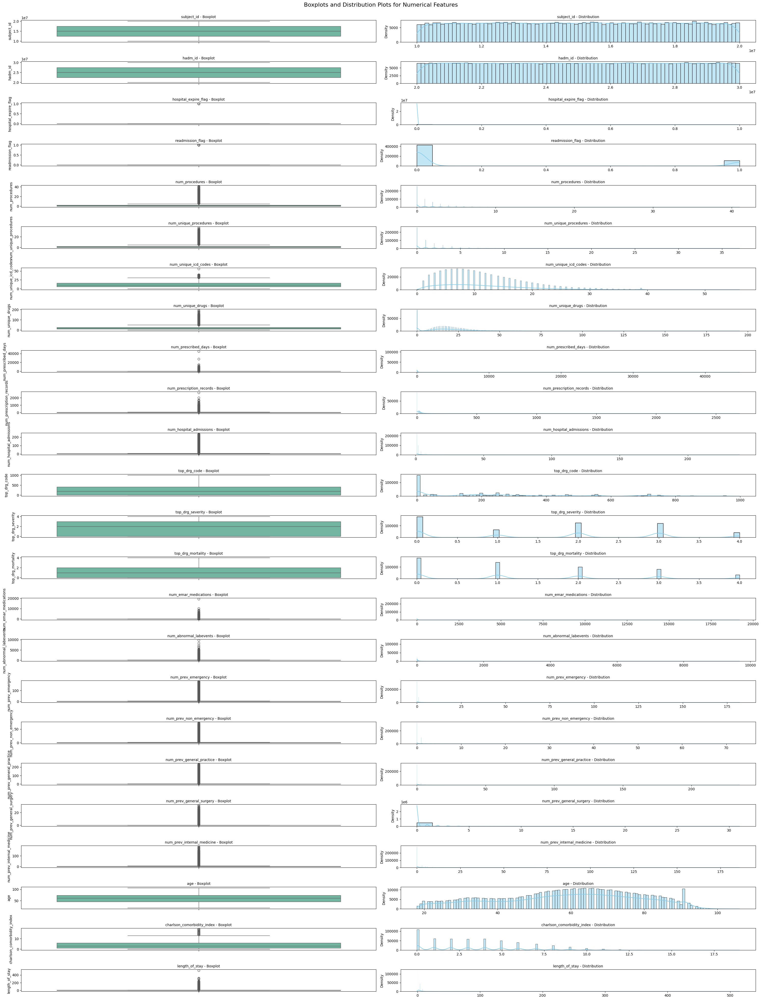

In [109]:
import matplotlib.pyplot as plt
import seaborn as sns

numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
plt.figure(figsize=(30, 40))
plt.suptitle('Boxplots and Distribution Plots for Numerical Features', fontsize=16)

for i, col in enumerate(numerical_cols, 1):
    plt.subplot(len(numerical_cols), 2, 2*i-1)
    sns.boxplot(y=df[col], palette="Set2")
    plt.title(f'{col} - Boxplot', fontsize=10)
    plt.xlabel('')

    plt.subplot(len(numerical_cols), 2, 2*i)
    sns.histplot(df[col], kde=True, color='skyblue')
    plt.title(f'{col} - Distribution', fontsize=10)
    plt.xlabel('')
    plt.ylabel('Density')

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()

### 2.3 Column-wise exploration

In [19]:
df.race.unique()

array(['BLACK/AFRICAN AMERICAN', 'WHITE', 'HISPANIC OR LATINO',
       'WHITE - OTHER EUROPEAN', 'BLACK/CAPE VERDEAN', 'BLACK/AFRICAN',
       'OTHER', 'UNKNOWN', 'HISPANIC/LATINO - PUERTO RICAN', 'ASIAN',
       'ASIAN - CHINESE', 'PORTUGUESE', 'BLACK/CARIBBEAN ISLAND',
       'NATIVE HAWAIIAN OR OTHER PACIFIC ISLANDER',
       'HISPANIC/LATINO - DOMINICAN', 'UNABLE TO OBTAIN',
       'ASIAN - ASIAN INDIAN', 'WHITE - RUSSIAN', 'WHITE - BRAZILIAN',
       'HISPANIC/LATINO - SALVADORAN', 'PATIENT DECLINED TO ANSWER',
       'ASIAN - SOUTH EAST ASIAN', 'AMERICAN INDIAN/ALASKA NATIVE',
       'HISPANIC/LATINO - CENTRAL AMERICAN', 'WHITE - EASTERN EUROPEAN',
       'HISPANIC/LATINO - GUATEMALAN', 'HISPANIC/LATINO - COLUMBIAN',
       'HISPANIC/LATINO - HONDURAN', 'ASIAN - KOREAN',
       'HISPANIC/LATINO - MEXICAN', 'MULTIPLE RACE/ETHNICITY',
       'SOUTH AMERICAN', 'HISPANIC/LATINO - CUBAN'], dtype=object)

In [22]:
print(df[df['race'] == 'UNKNOWN'].shape)
print(df[df['race'] == 'UNABLE TO OBTAIN'].shape)
print(df[df['race'] == 'PATIENT DECLINED TO ANSWER'].shape)

(12267, 30)
(3143, 30)
(2126, 30)


In [23]:
df['race'] = df['race'].replace(['UNABLE TO OBTAIN', 'PATIENT DECLINED TO ANSWER'], 'UNKNOWN')
df['race'].unique()

array(['BLACK/AFRICAN AMERICAN', 'WHITE', 'HISPANIC OR LATINO',
       'WHITE - OTHER EUROPEAN', 'BLACK/CAPE VERDEAN', 'BLACK/AFRICAN',
       'OTHER', 'UNKNOWN', 'HISPANIC/LATINO - PUERTO RICAN', 'ASIAN',
       'ASIAN - CHINESE', 'PORTUGUESE', 'BLACK/CARIBBEAN ISLAND',
       'NATIVE HAWAIIAN OR OTHER PACIFIC ISLANDER',
       'HISPANIC/LATINO - DOMINICAN', 'ASIAN - ASIAN INDIAN',
       'WHITE - RUSSIAN', 'WHITE - BRAZILIAN',
       'HISPANIC/LATINO - SALVADORAN', 'ASIAN - SOUTH EAST ASIAN',
       'AMERICAN INDIAN/ALASKA NATIVE',
       'HISPANIC/LATINO - CENTRAL AMERICAN', 'WHITE - EASTERN EUROPEAN',
       'HISPANIC/LATINO - GUATEMALAN', 'HISPANIC/LATINO - COLUMBIAN',
       'HISPANIC/LATINO - HONDURAN', 'ASIAN - KOREAN',
       'HISPANIC/LATINO - MEXICAN', 'MULTIPLE RACE/ETHNICITY',
       'SOUTH AMERICAN', 'HISPANIC/LATINO - CUBAN'], dtype=object)

In [25]:
df.columns

Index(['subject_id', 'hadm_id', 'race', 'admittime', 'dischtime',
       'hospital_expire_flag', 'readmission_flag', 'num_procedures',
       'num_unique_procedures', 'num_unique_icd_codes', 'num_unique_drugs',
       'num_prescribed_days', 'num_prescription_records',
       'num_hospital_admissions', 'proc_icd_codes', 'diag_icd_codes',
       'drg_concat', 'top_drg_code', 'top_drg_type', 'top_drg_severity',
       'top_drg_mortality', 'num_emar_medications', 'num_abnormal_labevents',
       'num_prev_emergency', 'num_prev_non_emergency',
       'num_prev_general_practice', 'num_prev_general_surgery',
       'num_prev_internal_medicine', 'age', 'charlson_comorbidity_index'],
      dtype='object')

In [44]:
df['drg_concat'].unique()

array(['HCFA 768 APR 542', 'HCFA 181 APR 136', 'HCFA 816 APR 663', ...,
       'HCFA 885 APR 751', 'HCFA 897 APR 751', 'HCFA 876 APR 751'],
      dtype=object)

In [45]:
df.drop(['drg_concat'], inplace=True, axis=1)

In [50]:
df.head()

,subject_id,hadm_id,race,admittime,dischtime,hospital_expire_flag,readmission_flag,num_procedures,num_unique_procedures,num_unique_icd_codes,num_unique_drugs,num_prescribed_days,num_prescription_records,num_hospital_admissions,proc_icd_codes,diag_icd_codes,top_drg_code,top_drg_type,top_drg_severity,top_drg_mortality,num_emar_medications,num_abnormal_labevents,num_prev_emergency,num_prev_non_emergency,num_prev_general_practice,num_prev_general_surgery,num_prev_internal_medicine,age,charlson_comorbidity_index
0,18671630,29554955,BLACK/AFRICAN AMERICAN,2198-02-24 12:05:00,2198-03-01 14:35:00,0,0,6.0,5.0,18.0,23.0,78.0,29.0,3,10E0XZZ 10907ZC 0UQMXZZ 0WCG0ZZ 0UB70ZZ 0UB70ZZ,O480 Z370 K661 D62 O721 O26833 O9943 Z20822 Z3...,542.0,APR,3.0,2.0,45.0,44.0,0,2,0,0,0,33,0
1,13118941,23589399,WHITE,2148-04-30 17:55:00,2148-05-02 18:20:00,0,0,2.0,2.0,8.0,12.0,24.0,13.0,2,3201 3391,1628 1961 5180 53081 30002 4430 V103 V4571,136.0,APR,2.0,2.0,0.0,14.0,1,0,0,0,4,55,7
2,10556002,24958178,WHITE,2158-02-05 16:29:00,2158-02-07 16:17:00,0,0,1.0,1.0,8.0,11.0,24.0,15.0,2,966,2883 E9361 51889 4928 2722 34590 V441 78079,663.0,APR,2.0,1.0,0.0,15.0,1,0,0,0,1,60,2
3,10730408,27077770,WHITE,2187-05-04 20:49:00,2187-05-06 08:28:00,0,0,1.0,1.0,6.0,13.0,18.0,13.0,3,8611,1737 7824 6959 7823 29590 42731,385.0,APR,2.0,2.0,0.0,21.0,0,2,0,1,4,81,4
4,10892159,29607512,HISPANIC OR LATINO,2129-01-24 15:10:00,2129-01-26 15:06:00,0,0,0.0,0.0,4.0,13.0,24.0,16.0,1,,78900 2809 5589 311,251.0,APR,1.0,1.0,0.0,18.0,0,0,0,0,0,62,2


### 2.4 Word embeddings for diag_icd_codes and proc_icd_codes

In [66]:
import nltk
import gensim
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
%matplotlib inline
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /Users/sansh/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
# Build corpus for Word2Vec model
def build_corpus(data, column):
    proc_corpus = []
    for sentence in data[column]:
        word_list = sentence.split(" ")
        proc_corpus.append(word_list)
            
    return proc_corpus

proc_corpus = build_corpus(df, 'proc_icd_codes')

In [60]:
diag_corpus = build_corpus(df, 'diag_icd_codes')

In [ ]:
# Train Word2Vec model on the procedure codes corpus
proc_model = Word2Vec(proc_corpus, vector_size=100, window=2, min_count=1, workers=-1)
proc_model.wv['0WCG0ZZ']

array([-3.05713410e-03,  3.51801864e-03,  6.58362173e-03, -5.14769182e-03,
        7.21783610e-04, -7.55923148e-03, -6.64239284e-03,  8.35543848e-04,
        8.18605442e-03, -7.04190135e-03,  1.41496654e-03, -9.46528278e-03,
        3.65138054e-03,  6.15702616e-03, -9.33657400e-03, -3.68899456e-03,
       -5.47852414e-03, -4.63687535e-03,  8.47572647e-03,  1.35286327e-03,
       -6.58600917e-03,  4.55293659e-04,  9.29606240e-03, -2.08609947e-03,
       -6.86158286e-03, -3.63981957e-03,  1.06075522e-03, -1.28778815e-03,
        3.68572702e-03, -4.96479275e-04,  9.02245287e-03,  6.97060116e-03,
        7.66328117e-03, -9.97696165e-03,  3.84866842e-03,  6.69078249e-03,
        9.69376694e-03,  2.33149761e-03,  3.33608268e-03, -4.57186578e-03,
       -2.95242784e-03, -9.76558949e-04,  8.82300269e-03, -7.57821556e-03,
        9.98070557e-03, -2.90870667e-05,  3.72396945e-03,  3.68750934e-03,
       -5.28859952e-03, -7.08576804e-03,  1.75793294e-03, -5.37879474e-04,
        7.26496568e-03,  

In [ ]:
# Train Word2Vec model on the diagnosis codes corpus
diag_model = Word2Vec(diag_corpus, vector_size=100, window=2, min_count=1, workers=-1)
diag_model.wv['Z3A40']

array([ 0.00083076, -0.00209655, -0.00743566,  0.00034598, -0.00052056,
        0.00058292, -0.0055101 ,  0.00228762,  0.00269143,  0.00699984,
       -0.00952331, -0.00164604,  0.00303647, -0.0052217 ,  0.00308438,
       -0.00323315, -0.00260106,  0.00306096,  0.00452013, -0.0070609 ,
        0.00224548, -0.00609067,  0.00637245,  0.00465763, -0.0005912 ,
       -0.00372461,  0.00994636,  0.00169472,  0.00283693, -0.00620816,
       -0.00952358, -0.00474824, -0.00753074, -0.00805723, -0.00173616,
        0.00124709,  0.0042625 , -0.00361814, -0.00280942,  0.00376177,
       -0.00695193,  0.00844506, -0.00434417,  0.00050535,  0.00397794,
       -0.00942433, -0.00757155, -0.00209492, -0.00512381, -0.00105791,
        0.00190579,  0.00506732,  0.00829512,  0.00757912,  0.00221567,
       -0.00323014,  0.00201475, -0.00756303, -0.00887058, -0.00626183,
        0.00428839,  0.00038667,  0.00299824, -0.00713404,  0.00957251,
       -0.00021515, -0.00207384,  0.00395976, -0.0073477 ,  0.00

In [ ]:
import numpy as np

# Function to generate patient-level vector by aggregating diagnosis/procedure codes
def get_patient_vector(code_list, model, num_vectors=25):
    codes = code_list.split()
    valid_vectors = [model.wv[code] for code in code_list.split()]  # vectors for each code
    valid_vectors = valid_vectors[-num_vectors:]  # last 25 or all available
    if len(valid_vectors) == 0:
        return model.wv['']  # return zero vector if no valid codes
    return np.sum(valid_vectors, axis=0)  # sum vectors

df["diag_vector"] = df["diag_icd_codes"].apply(lambda x: get_patient_vector(x, diag_model, num_vectors=25))
df["proc_vector"] = df["proc_icd_codes"].apply(lambda x: get_patient_vector(x, proc_model, num_vectors=25))

In [110]:
df.columns

Index(['subject_id', 'hadm_id', 'race', 'admittime', 'dischtime',
       'hospital_expire_flag', 'readmission_flag', 'num_procedures',
       'num_unique_procedures', 'num_unique_icd_codes', 'num_unique_drugs',
       'num_prescribed_days', 'num_prescription_records',
       'num_hospital_admissions', 'proc_icd_codes', 'diag_icd_codes',
       'top_drg_code', 'top_drg_type', 'top_drg_severity', 'top_drg_mortality',
       'num_emar_medications', 'num_abnormal_labevents', 'num_prev_emergency',
       'num_prev_non_emergency', 'num_prev_general_practice',
       'num_prev_general_surgery', 'num_prev_internal_medicine', 'age',
       'charlson_comorbidity_index', 'diag_vector', 'proc_vector',
       'length_of_stay'],
      dtype='object')

In [111]:
df.to_csv("../../Dataset/Modified_Actual_Data.csv")

In [143]:
temp_df = df.copy()

In [ ]:
import pandas as pd

# Function to expand vector columns into multiple columns
def expand_vector_column(tdf, column_name):
    vec_dim = len(tdf[column_name].iloc[0])
    vec_cols = [f"{column_name}_{i}" for i in range(vec_dim)]
    
    tdf[vec_cols] = pd.DataFrame(tdf[column_name].tolist(), index=tdf.index, dtype='float64')
    tdf.drop([column_name], inplace=True, axis=1)

expand_vector_column(temp_df, "diag_vector")
expand_vector_column(temp_df, "proc_vector")

/var/folders/5m/j6vy15712wdbb9xdp1dmy0jw0000gn/T/ipykernel_5552/1061373968.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  tdf[vec_cols] = pd.DataFrame(tdf[column_name].tolist(), index=tdf.index, dtype='float64')
/var/folders/5m/j6vy15712wdbb9xdp1dmy0jw0000gn/T/ipykernel_5552/1061373968.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  tdf[vec_cols] = pd.DataFrame(tdf[column_name].tolist(), index=tdf.index, dtype='float64')
/var/folders/5m/j6vy15712wdbb9xdp1dmy0jw0000gn/T/ipykernel_5552/1061373968.py:5: PerformanceWarning:

In [ ]:
# Dropping the original diag_icd_codes and proc_icd_codes columns as they are no longer needed
temp_df.drop(['diag_icd_codes', 'proc_icd_codes'], axis=1, inplace=True)

### 2.5 Save the features

In [ ]:
# Save the Features to a CSV file
temp_df.to_csv("../../Dataset/Vector_Modified_Actual_Data.csv")